In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
data = pd.read_csv("/Users/hilalyurtoglu/Downloads/insurance_claims.csv")

In [3]:
data.head(20)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
5,256,39,104594,2006-10-12,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
6,137,34,413978,2000-06-04,IN,250/500,1000,1333.35,0,441716,...,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,429027,1990-02-03,IL,100/300,1000,1137.03,0,603195,...,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
8,27,33,485665,1997-02-05,IL,100/300,500,1442.99,0,601734,...,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
9,212,42,636550,2011-07-25,IL,100/300,500,1315.68,0,600983,...,1,?,42300,4700,4700,32900,Saab,92x,1996,N


In [4]:
data.shape

(1000, 39)

In [5]:
data.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

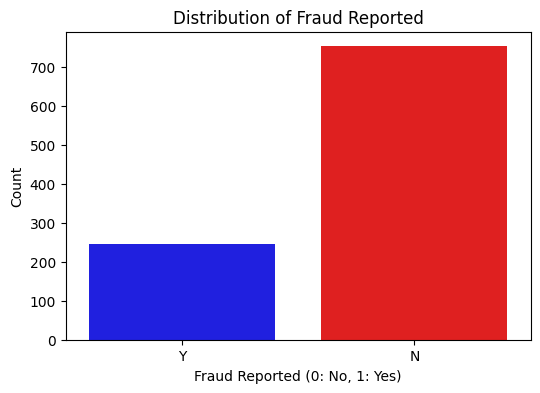

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Custom colors for the countplot (gray for 0 and red for 1)
plt.figure(figsize=(6, 4))
sns.countplot(x=data['fraud_reported'], palette=['blue', 'red'])
plt.title('Distribution of Fraud Reported')
plt.xlabel('Fraud Reported (0: No, 1: Yes)')
plt.ylabel('Count')
plt.show()


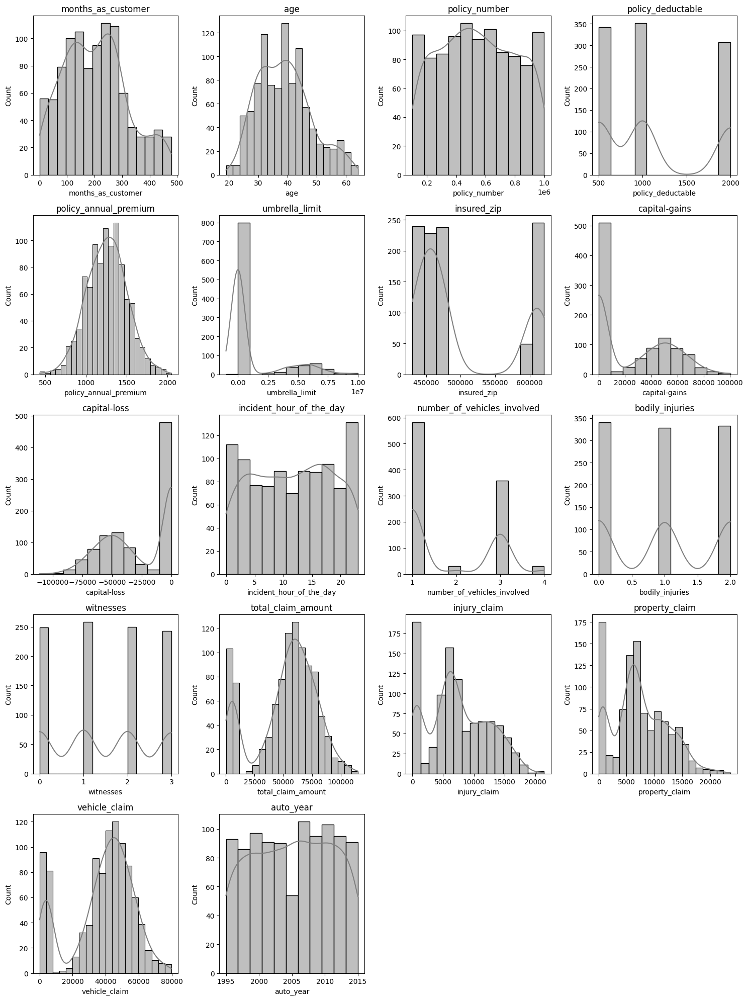

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution of numerical features
numerical_features = data.select_dtypes(include=['int64', 'float64']).columns

# Adjust the number of rows and columns to accommodate all features
num_rows = (len(numerical_features) // 4) + 1  # This ensures enough rows to fit all features

plt.figure(figsize=(15, num_rows * 4))  # Adjust the height based on number of rows
for i, col in enumerate(numerical_features, 1):
    plt.subplot(num_rows, 4, i)
    sns.histplot(data[col], kde=True, color='gray')  # Set color to gray
    plt.title(col)

plt.tight_layout()
plt.show()


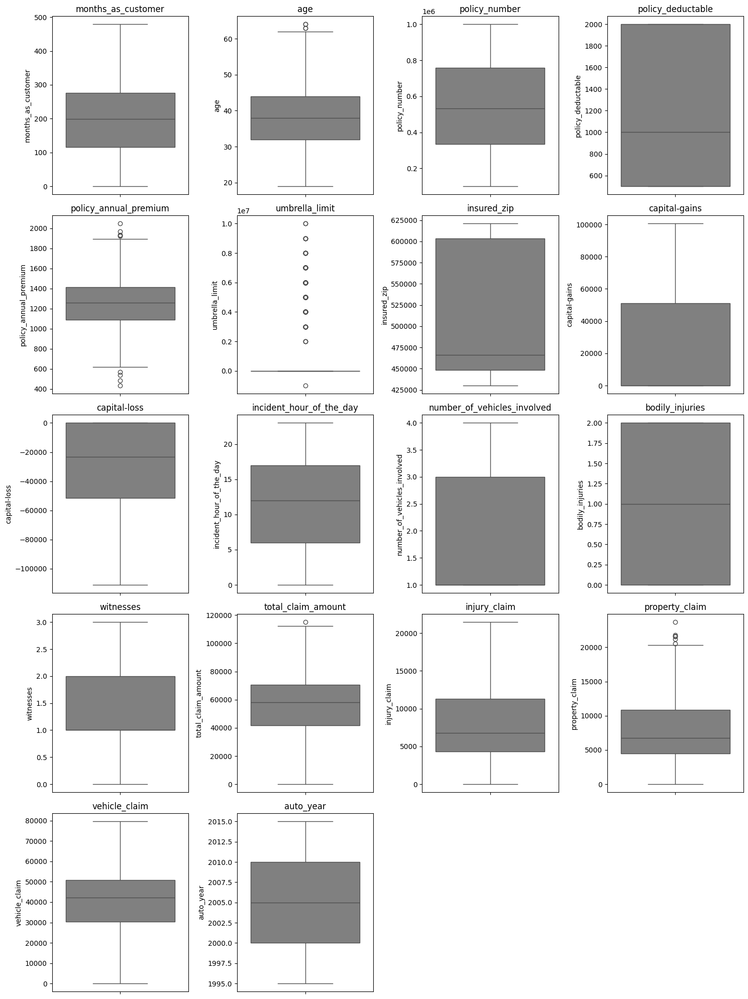

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution of numerical features
numerical_features = data.select_dtypes(include=['int64', 'float64']).columns

# Adjust the number of rows and columns to accommodate all features
num_rows = (len(numerical_features) // 4) + 1  # This ensures enough rows to fit all features

plt.figure(figsize=(15, num_rows * 4))  # Adjust the height based on number of rows
for i, col in enumerate(numerical_features, 1):
    plt.subplot(num_rows, 4, i)
    sns.boxplot(y=data[col], color='gray')  # Set color to gray
    plt.title(col)

plt.tight_layout()
plt.show()


In [10]:
data.replace('?', np.nan, inplace = True)

In [11]:
print(data.isnull().sum())

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [12]:
import pandas as pd

# Veriyi yükleme (burada veri setinizin adını kullanmalısınız)
# data = pd.read_csv('veri_seti.csv')

# Mode (mod) değeri ile eksik verileri doldurma
data['collision_type'] = data['collision_type'].fillna(data['collision_type'].mode()[0])
data['authorities_contacted'] = data['authorities_contacted'].fillna(data['authorities_contacted'].mode()[0])
data['property_damage'] = data['property_damage'].fillna(data['property_damage'].mode()[0])
data['police_report_available'] = data['police_report_available'].fillna(data['police_report_available'].mode()[0])

# Doldurma işleminden sonra veri setini kontrol et
print(data.isnull().sum())


months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [13]:
data['policy_bind_date'] = pd.to_datetime(data['policy_bind_date'], errors = 'coerce')

In [14]:
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [15]:
# let's encode the fraud report to numerical values

data['fraud_reported'] = data['fraud_reported'].replace(('Y','N'),(0,1))

# checking the values of fraud reported
# data['fraud_reported'].value_counts()

In [16]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for auto_model
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for auto_model
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each auto_model in the training set
    mean_target = train_data.groupby('auto_model')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's auto_model column
    valid_data['auto_model_encoded'] = valid_data['auto_model'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['auto_model_encoded'] = data['auto_model'].map(target_encoding_map)

# Show the encoded column
data[['auto_model', 'auto_model_encoded']].head(20)
data['auto_model']=data['auto_model_encoded']
data=data.drop(['auto_model_encoded'], axis=1)


In [17]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for policy_state
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for policy_state
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each policy_state in the training set
    mean_target = train_data.groupby('policy_state')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's policy_state column
    valid_data['policy_state_encoded'] = valid_data['policy_state'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['policy_state_encoded'] = data['policy_state'].map(target_encoding_map)

# Show the encoded column
data[['policy_state', 'policy_state_encoded']].head(20)
data['policy_state'] = data['policy_state_encoded']
data = data.drop(['policy_state_encoded'], axis=1)


In [18]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for policy_csl
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for policy_csl
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each policy_csl in the training set
    mean_target = train_data.groupby('policy_csl')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's policy_csl column
    valid_data['policy_csl_encoded'] = valid_data['policy_csl'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['policy_csl_encoded'] = data['policy_csl'].map(target_encoding_map)

# Show the encoded column
data[['policy_csl', 'policy_csl_encoded']].head(20)
data['policy_csl'] = data['policy_csl_encoded']
data = data.drop(['policy_csl_encoded'], axis=1)


In [19]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for insured_sex
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for insured_sex
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each insured_sex in the training set
    mean_target = train_data.groupby('insured_sex')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's insured_sex column
    valid_data['insured_sex_encoded'] = valid_data['insured_sex'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['insured_sex_encoded'] = data['insured_sex'].map(target_encoding_map)

# Show the encoded column
data[['insured_sex', 'insured_sex_encoded']].head(20)
data['insured_sex'] = data['insured_sex_encoded']
data = data.drop(['insured_sex_encoded'], axis=1)


In [20]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for insured_education_level
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for insured_education_level
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each insured_education_level in the training set
    mean_target = train_data.groupby('insured_education_level')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's insured_education_level column
    valid_data['insured_education_level_encoded'] = valid_data['insured_education_level'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['insured_education_level_encoded'] = data['insured_education_level'].map(target_encoding_map)

# Show the encoded column
data[['insured_education_level', 'insured_education_level_encoded']].head(20)
data['insured_education_level'] = data['insured_education_level_encoded']
data = data.drop(['insured_education_level_encoded'], axis=1)


In [21]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for insured_occupation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for insured_occupation
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each insured_occupation in the training set
    mean_target = train_data.groupby('insured_occupation')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's insured_occupation column
    valid_data['insured_occupation_encoded'] = valid_data['insured_occupation'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['insured_occupation_encoded'] = data['insured_occupation'].map(target_encoding_map)

# Show the encoded column
data[['insured_occupation', 'insured_occupation_encoded']].head(20)
data['insured_occupation'] = data['insured_occupation_encoded']
data = data.drop(['insured_occupation_encoded'], axis=1)


In [22]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for insured_hobbies
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for insured_hobbies
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each insured_hobbies in the training set
    mean_target = train_data.groupby('insured_hobbies')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's insured_hobbies column
    valid_data['insured_hobbies_encoded'] = valid_data['insured_hobbies'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['insured_hobbies_encoded'] = data['insured_hobbies'].map(target_encoding_map)

# Show the encoded column
data[['insured_hobbies', 'insured_hobbies_encoded']].head(20)
data['insured_hobbies'] = data['insured_hobbies_encoded']
data = data.drop(['insured_hobbies_encoded'], axis=1)


In [23]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for insured_relationship
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for insured_relationship
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each insured_relationship in the training set
    mean_target = train_data.groupby('insured_relationship')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's insured_relationship column
    valid_data['insured_relationship_encoded'] = valid_data['insured_relationship'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['insured_relationship_encoded'] = data['insured_relationship'].map(target_encoding_map)

# Show the encoded column
data[['insured_relationship', 'insured_relationship_encoded']].head(20)
data['insured_relationship'] = data['insured_relationship_encoded']
data = data.drop(['insured_relationship_encoded'], axis=1)


In [24]:
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

# Assuming 'data' is already loaded and 'fraud_reported' is encoded as 0 and 1
# First, we will create a dictionary to store the encoded values for incident_type
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

# Perform K-fold target encoding for incident_type
for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    
    # Calculate the mean target value for each incident_type in the training set
    mean_target = train_data.groupby('incident_type')['fraud_reported'].mean()
    
    # Assign the target mean to the valid set's incident_type column
    valid_data['incident_type_encoded'] = valid_data['incident_type'].map(mean_target)
    
    # Save the encoding for the current fold
    target_encoding_map.update(mean_target.to_dict())

# Now, apply the target encoding to the full dataset (using the previously calculated mapping)
data['incident_type_encoded'] = data['incident_type'].map(target_encoding_map)

# Show the encoded column
data[['incident_type', 'incident_type_encoded']].head(20)
data['incident_type'] = data['incident_type_encoded']
data = data.drop(['incident_type_encoded'], axis=1)


In [25]:
from sklearn.preprocessing import LabelEncoder

# Create and fit label encoder
le = LabelEncoder()
collision_label_encoded = le.fit_transform(data['collision_type'])
data['collision_type']=collision_label_encoded



In [26]:
from sklearn.preprocessing import LabelEncoder

# Create and fit label encoder
le = LabelEncoder()
incident_label_encoded = le.fit_transform(data['incident_severity'])
data['incident_severity']=incident_label_encoded

In [27]:
# K-fold target encoding for authorities_contacted
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('authorities_contacted')['fraud_reported'].mean()
    valid_data['authorities_contacted_encoded'] = valid_data['authorities_contacted'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['authorities_contacted_encoded'] = data['authorities_contacted'].map(target_encoding_map)
data['authorities_contacted'] = data['authorities_contacted_encoded']
data = data.drop(['authorities_contacted_encoded'], axis=1)


In [28]:
# K-fold target encoding for incident_state
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('incident_state')['fraud_reported'].mean()
    valid_data['incident_state_encoded'] = valid_data['incident_state'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['incident_state_encoded'] = data['incident_state'].map(target_encoding_map)
data['incident_state'] = data['incident_state_encoded']
data = data.drop(['incident_state_encoded'], axis=1)


In [29]:
# K-fold target encoding for incident_city
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('incident_city')['fraud_reported'].mean()
    valid_data['incident_city_encoded'] = valid_data['incident_city'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['incident_city_encoded'] = data['incident_city'].map(target_encoding_map)
data['incident_city'] = data['incident_city_encoded']
data = data.drop(['incident_city_encoded'], axis=1)


In [30]:
# K-fold target encoding for incident_location
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('incident_location')['fraud_reported'].mean()
    valid_data['incident_location_encoded'] = valid_data['incident_location'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['incident_location_encoded'] = data['incident_location'].map(target_encoding_map)
data['incident_location'] = data['incident_location_encoded']
data = data.drop(['incident_location_encoded'], axis=1)


In [31]:
# K-fold target encoding for property_damage
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('property_damage')['fraud_reported'].mean()
    valid_data['property_damage_encoded'] = valid_data['property_damage'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['property_damage_encoded'] = data['property_damage'].map(target_encoding_map)
data['property_damage'] = data['property_damage_encoded']
data = data.drop(['property_damage_encoded'], axis=1)


In [32]:
# K-fold target encoding for police_report_available
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('police_report_available')['fraud_reported'].mean()
    valid_data['police_report_available_encoded'] = valid_data['police_report_available'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['police_report_available_encoded'] = data['police_report_available'].map(target_encoding_map)
data['police_report_available'] = data['police_report_available_encoded']
data = data.drop(['police_report_available_encoded'], axis=1)


In [33]:
# K-fold target encoding for police_report_available
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('police_report_available')['fraud_reported'].mean()
    valid_data['police_report_available_encoded'] = valid_data['police_report_available'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['police_report_available_encoded'] = data['police_report_available'].map(target_encoding_map)
data['police_report_available'] = data['police_report_available_encoded']
data = data.drop(['police_report_available_encoded'], axis=1)


In [34]:
# K-fold target encoding for auto_make
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
target_encoding_map = {}

for train_index, valid_index in kf.split(data):
    train_data, valid_data = data.iloc[train_index], data.iloc[valid_index]
    mean_target = train_data.groupby('auto_make')['fraud_reported'].mean()
    valid_data['auto_make_encoded'] = valid_data['auto_make'].map(mean_target)
    target_encoding_map.update(mean_target.to_dict())

data['auto_make_encoded'] = data['auto_make'].map(target_encoding_map)
data['auto_make'] = data['auto_make_encoded']
data = data.drop(['auto_make_encoded'], axis=1)


In [35]:
# Convert all integer columns to float
data = data.astype({col: 'float64' for col in data.select_dtypes(include=['int64']).columns})


In [36]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   float64       
 1   age                          1000 non-null   float64       
 2   policy_number                1000 non-null   float64       
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   float64       
 5   policy_csl                   1000 non-null   float64       
 6   policy_deductable            1000 non-null   float64       
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   float64       
 9   insured_zip                  1000 non-null   float64       
 10  insured_sex                  1000 non-null   float64       
 11  insured_education_level      1000 non-null  

In [37]:
# let's delete unnecassary columns

data = data.drop(['policy_number', 'insured_zip', 'incident_location',
                  'policy_bind_date', 'incident_date','injury_claim','property_claim', 'vehicle_claim','auto_model'], axis=1)
# let's check the columns after deleting the columns
data.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'auto_make',
       'auto_year', 'fraud_reported'],
      dtype='object')

### CORRELATION MATRIX

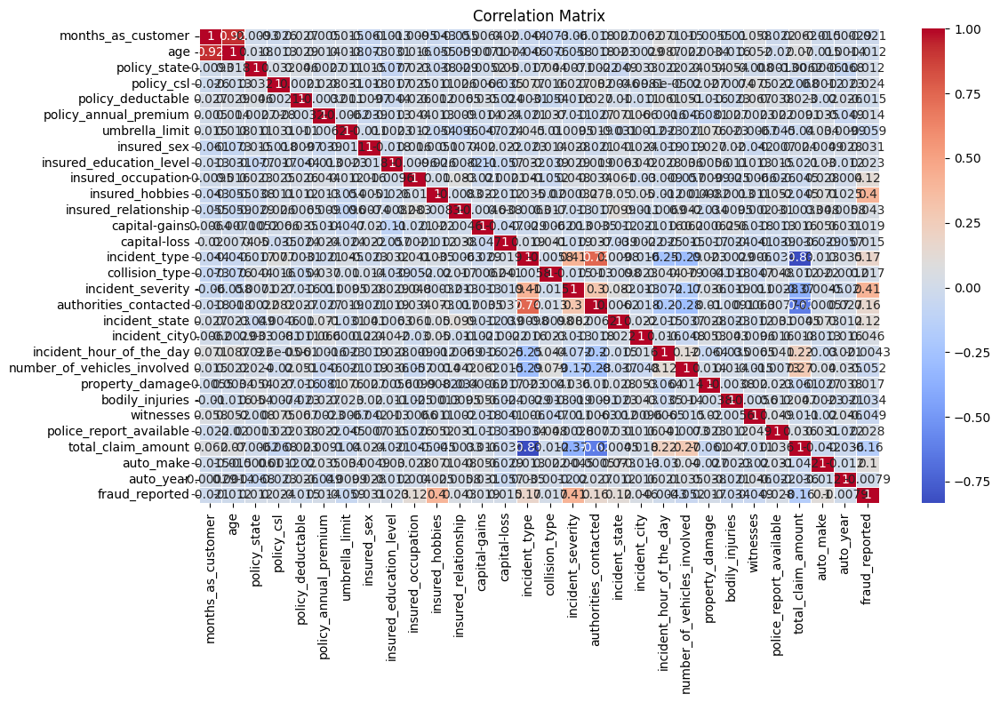


Fraud ile korelasyonlar:
fraud_reported                 1.000000
incident_severity              0.405988
insured_hobbies                0.398678
incident_type                  0.170595
authorities_contacted          0.159110
insured_occupation             0.123482
incident_state                 0.118079
auto_make                      0.101016
incident_city                  0.045772
insured_relationship           0.042760
insured_sex                    0.030873
police_report_available        0.027768
policy_csl                     0.024245
insured_education_level        0.022569
capital-gains                  0.019173
collision_type                 0.017315
property_damage                0.017202
capital-loss                   0.014863
policy_annual_premium          0.014480
policy_state                   0.012321
incident_hour_of_the_day      -0.004316
auto_year                     -0.007928
age                           -0.012143
policy_deductable             -0.014817
months_as_cust

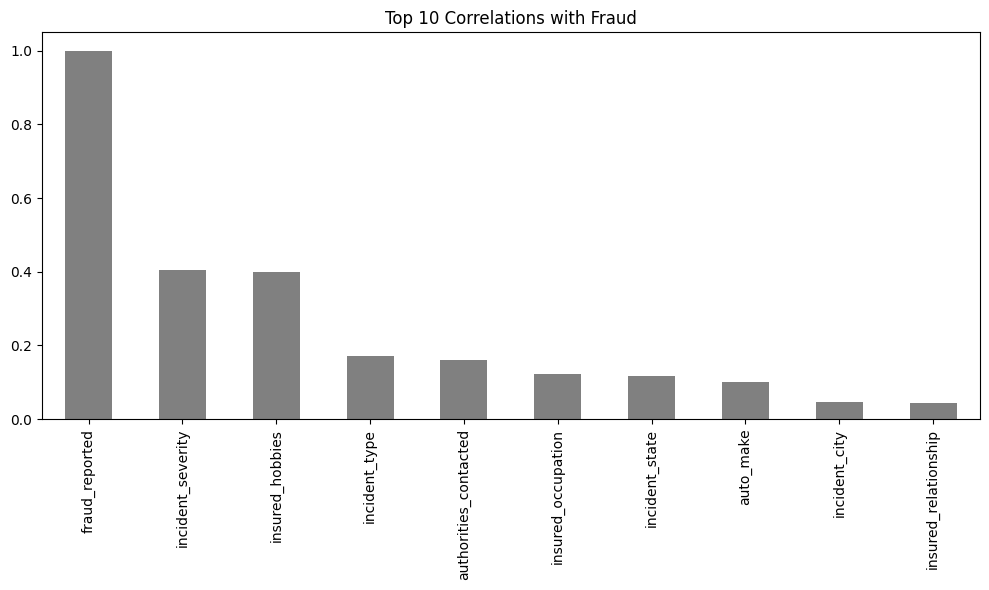

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Korelasyon matrisi
plt.figure(figsize=(12, 8))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidth=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# Fraud ile en yüksek korelasyonlu değişkenler
fraud_correlations = correlation_matrix['fraud_reported'].sort_values(ascending=False)
print("\nFraud ile korelasyonlar:")
print(fraud_correlations)

# En yüksek korelasyonlu değişkenleri görselleştir (top 10)
plt.figure(figsize=(10, 6))
fraud_correlations.head(10).plot(kind='bar', color='gray')  # Set color to gray
plt.title('Top 10 Correlations with Fraud')
plt.tight_layout()
plt.show()


In [39]:
from sklearn.preprocessing import StandardScaler

# Ölçeklendirme işlemine başlama
scaler = StandardScaler()

# Özellikleri seç
features = data.drop(columns=['fraud_reported'])  # Hedef değişkeni hariç tutarak
target = data['fraud_reported']

# Özellikleri ölçeklendir
features_scaled = scaler.fit_transform(features)

# Örnek olarak, özelliklerin ilk 5 satırını kontrol edebiliriz
print(features_scaled[:5])


[[ 1.07813958  0.99083647  0.66475194  0.56382213 -0.22238259  0.61670461
  -0.47947582 -1.07695274 -0.253332   -0.87882086  0.14665334  1.64974424
   1.01133064  0.95385051 -0.57976633  1.34400013 -1.26061352  0.55760657
  -0.57518306 -0.69352625 -0.95626066 -0.82386498 -1.5202823   0.00975947
   0.46183785  1.47807759  0.71425742  1.01250255 -0.1834404 ]
 [ 0.2089946   0.33407345 -1.49189735  0.56382213  1.41278352 -0.24252118
   1.69798022 -1.07695274 -0.253332   -0.23120083 -0.19625246 -0.71372278
  -0.90192678  0.95385051  2.26660732 -0.03023313 -0.19590615  0.55760657
   1.14505521  1.43674631 -0.5244753  -0.82386498  0.65777257 -1.21017372
  -1.33869959 -0.67655447 -1.80731185 -1.10165469  0.31549088]
 [-0.60800168 -1.08891308  0.66475194 -1.35220536  1.41278352  0.64223266
   1.69798022  0.92854585 -2.26173203 -0.05670463  0.00817215  0.02301432
   0.35802323  0.95385051 -0.34864203 -0.03023313 -0.19590615  0.55760657
   0.348147   -0.69352625 -0.66840375  1.1400563   0.6577725

In [40]:
feature_names = [
    "MAC",
    "AGE",
    "PS",
    "PC",
    "PD",
    "PAP",
    "UL",
    "SEX",
    "IEL",
    "IO",
    "IH",
    "CG",
    "CL",
    "IT",
    "CT",
    "ISV",
    "AC",
    "INS",
    "INC",
    "IHD",
    "NVI",
    "PRD",
    "BJI",
    "WIT",
    "PRA",
    "TCA",
    "AM",
    "AY",
    "IM",
    "ID"
]


## WITHOUT SMOTE 

## RF

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Random Forest Classifier model
rf = RandomForestClassifier(random_state=42)

# Fit the model with the training data
rf.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = rf.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.79

Classification Report:
              precision    recall  f1-score   support

         0.0       0.63      0.58      0.60        55
         1.0       0.85      0.87      0.86       145

    accuracy                           0.79       200
   macro avg       0.74      0.73      0.73       200
weighted avg       0.79      0.79      0.79       200



## XGBoost

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# XGBoost Classifier model
xgb = XGBClassifier(random_state=42)

# Fit the model with the training data
xgb.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = xgb.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


[15:44:20] WARNING: /Users/hilalyurtoglu/xgboost-1.4.2/build/temp.macosx-10.9-universal2-cpython-312/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Modelin Doğruluğu:  0.775

Classification Report:
              precision    recall  f1-score   support

         0.0       0.60      0.56      0.58        55
         1.0       0.84      0.86      0.85       145

    accuracy                           0.78       200
   macro avg       0.72      0.71      0.71       200
weighted avg       0.77      0.78      0.77       200



## Logistic 

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression model
log_reg = LogisticRegression(random_state=42)

# Fit the model with the training data
log_reg.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = log_reg.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.805

Classification Report:
              precision    recall  f1-score   support

         0.0       0.69      0.53      0.60        55
         1.0       0.84      0.91      0.87       145

    accuracy                           0.81       200
   macro avg       0.76      0.72      0.73       200
weighted avg       0.80      0.81      0.80       200



## KNN 

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# KNN Classifier model
knn = KNeighborsClassifier()

# Fit the model with the training dataA
knn.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = knn.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.735

Classification Report:
              precision    recall  f1-score   support

         0.0       0.54      0.24      0.33        55
         1.0       0.76      0.92      0.83       145

    accuracy                           0.73       200
   macro avg       0.65      0.58      0.58       200
weighted avg       0.70      0.73      0.70       200



## AdaBoost

In [45]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# AdaBoost Classifier model
ada_boost = AdaBoostClassifier(random_state=42)

# Fit the model with the training data
ada_boost.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = ada_boost.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.74

Classification Report:
              precision    recall  f1-score   support

         0.0       0.54      0.40      0.46        55
         1.0       0.79      0.87      0.83       145

    accuracy                           0.74       200
   macro avg       0.66      0.63      0.64       200
weighted avg       0.72      0.74      0.73       200



## SVM 

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Support Vector Machine model
svm = SVC(random_state=42, probability=True)

# Fit the model with the training data
svm.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = svm.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.785

Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.38      0.49        55
         1.0       0.80      0.94      0.86       145

    accuracy                           0.79       200
   macro avg       0.75      0.66      0.68       200
weighted avg       0.77      0.79      0.76       200



## GNB 

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Naive Bayes Classifier model
gnb = GaussianNB()

# Fit the model with the training data
gnb.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = gnb.predict(X_test_scaled)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.77

Classification Report:
              precision    recall  f1-score   support

         0.0       0.57      0.65      0.61        55
         1.0       0.86      0.81      0.84       145

    accuracy                           0.77       200
   macro avg       0.72      0.73      0.72       200
weighted avg       0.78      0.77      0.77       200



## DT 

In [48]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Decision Tree Classifier model
dt_clf = DecisionTreeClassifier(random_state=42)

# Fit the model with the training data
dt_clf.fit(X_train, y_train)

# Predict on the test data
y_pred = dt_clf.predict(X_test)

# Print the accuracy of the model
print("Modelin Doğruluğu: ", accuracy_score(y_test, y_pred))

# Classification report for the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Modelin Doğruluğu:  0.76

Classification Report:
              precision    recall  f1-score   support

         0.0       0.56      0.58      0.57        55
         1.0       0.84      0.83      0.83       145

    accuracy                           0.76       200
   macro avg       0.70      0.70      0.70       200
weighted avg       0.76      0.76      0.76       200



## Gradient Boosting 

In [49]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score

# Split the dataset into features and target variable
X = data.drop(columns=['fraud_reported'])
y = data['fraud_reported']

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Train the Gradient Boosting model
gb_model.fit(X_train_scaled, y_train)

# Predict using the test set
y_pred = gb_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Model's Test Set Accuracy: 0.845
Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.63      0.67        49
         1.0       0.88      0.91      0.90       151

    accuracy                           0.84       200
   macro avg       0.79      0.77      0.78       200
weighted avg       0.84      0.84      0.84       200



## VOTING  

In [51]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Split the dataset into features and target variable
X = data.drop(columns=['fraud_reported'])
y = data['fraud_reported']

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the models
adaboost_model = AdaBoostClassifier(random_state=42)
gnb_model = GaussianNB()
gb_model = GradientBoostingClassifier(random_state=42)

# Create the Voting Classifier (using hard voting)
voting_clf = VotingClassifier(estimators=[
    ('adaboost', adaboost_model),
    ('gnb', gnb_model),
    ('gradient_boosting', gb_model)
], voting='hard')  # Use 'soft' for averaging probabilities if desired

# Train the Voting Classifier
voting_clf.fit(X_train_scaled, y_train)

# Predict using the Voting Classifier on the test set
y_pred = voting_clf.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Model's Test Set Accuracy: 0.86
Classification Report:
               precision    recall  f1-score   support

         0.0       0.74      0.65      0.70        49
         1.0       0.89      0.93      0.91       151

    accuracy                           0.86       200
   macro avg       0.82      0.79      0.80       200
weighted avg       0.86      0.86      0.86       200



## SMOTE

In [50]:
import pandas as pd

# Load your dataset (ensure 'data' is properly defined)
# data = pd.read_csv("your_dataset.csv")

# Splitting data into features and target variable
X = data.drop(columns=['fraud_reported'])
y = data['fraud_reported']

# Görüntüleyelim
print("Özelliklerin İlk 5 Satırı:\n", X.head())
print("\nHedef Değişken Dağılımı:\n", y.value_counts())


Özelliklerin İlk 5 Satırı:
    months_as_customer   age  policy_state  policy_csl  policy_deductable  \
0               328.0  48.0      0.758993    0.757895             1000.0   
1               228.0  42.0      0.733871    0.757895             2000.0   
2               134.0  29.0      0.758993    0.735915             2000.0   
3               256.0  41.0      0.759124    0.757895             2000.0   
4               228.0  44.0      0.759124    0.761905             1000.0   

   policy_annual_premium  umbrella_limit  insured_sex  \
0                1406.91             0.0     0.739726   
1                1197.22       5000000.0     0.739726   
2                1413.14       5000000.0     0.760920   
3                1415.74       6000000.0     0.760920   
4                1583.91       6000000.0     0.739726   

   insured_education_level  insured_occupation  ...  incident_city  \
0                 0.745455            0.698413  ...       0.737288   
1                 0.745455      

In [51]:
from sklearn.model_selection import train_test_split

# Splitting into train and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    random_state=42, 
                                                    stratify=y)

# Boyutları kontrol edelim
print("Eğitim Seti Boyutu:", X_train.shape, y_train.shape)
print("Test Seti Boyutu:", X_test.shape, y_test.shape)


Eğitim Seti Boyutu: (800, 29) (800,)
Test Seti Boyutu: (200, 29) (200,)


In [52]:
from imblearn.over_sampling import SMOTE

# SMOTE ile azınlık sınıfı örneklerini artır
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# SMOTE sonrası sınıf dağılımını görüntüleyelim
print("SMOTE Uygulandıktan Sonraki Dağılım:\n", y_train_resampled.value_counts())
print("Yeni Eğitim Seti Boyutu:", X_train_resampled.shape, y_train_resampled.shape)


SMOTE Uygulandıktan Sonraki Dağılım:
 1.0    602
0.0    602
Name: fraud_reported, dtype: int64
Yeni Eğitim Seti Boyutu: (1204, 29) (1204,)


## RF

#### WITHOUT HYPERPARAMETER TUNING

In [53]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

# Pipeline oluştur (Ölçeklendirme + Random Forest)
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=42))
])


In [54]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Sınıflandırma raporu
classification_rep = classification_report(y_test, y_pred)

# Doğruluk oranı
accuracy = accuracy_score(y_test, y_pred)

# Karışıklık matrisi (Confusion Matrix)
conf_matrix = confusion_matrix(y_test, y_pred)

# Sonuçları yazdır
print("\nClassification Report:\n", classification_rep)
print("\nAccuracy Score:", accuracy)
print("\nConfusion Matrix:\n", conf_matrix)



Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.63      0.67        49
         1.0       0.88      0.91      0.90       151

    accuracy                           0.84       200
   macro avg       0.79      0.77      0.78       200
weighted avg       0.84      0.84      0.84       200


Accuracy Score: 0.845

Confusion Matrix:
 [[ 31  18]
 [ 13 138]]


#### WITH HYPERPARAMETER TUNING

In [55]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

# Pipeline oluştur (Ölçeklendirme + Random Forest)
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=42))
])


In [56]:
from sklearn.model_selection import GridSearchCV

# Hiperparametre ızgarası
param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [10, 20, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# GridSearchCV ile en iyi modeli bul
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_resampled, y_train_resampled)

# En iyi parametreleri göster
print("En İyi Hiperparametreler:", grid_search.best_params_)


En İyi Hiperparametreler: {'classifier__max_depth': 20, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}


In [57]:
# En iyi modeli al
best_model = grid_search.best_estimator_

# Test seti üzerinde tahmin yap
y_pred = best_model.predict(X_test)


In [58]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Sınıflandırma raporu
classification_rep = classification_report(y_test, y_pred)

# Doğruluk oranı
accuracy = accuracy_score(y_test, y_pred)

# Karışıklık matrisi (Confusion Matrix)
conf_matrix = confusion_matrix(y_test, y_pred)

# Sonuçları yazdır
print("\nClassification Report:\n", classification_rep)
print("\nAccuracy Score:", accuracy)
print("\nConfusion Matrix:\n", conf_matrix)






Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.67      0.69        49
         1.0       0.90      0.91      0.90       151

    accuracy                           0.85       200
   macro avg       0.81      0.79      0.80       200
weighted avg       0.85      0.85      0.85       200


Accuracy Score: 0.855

Confusion Matrix:
 [[ 33  16]
 [ 13 138]]


En İyi Hiperparametreler: {'classifier__max_depth': 20, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}

Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.67      0.69        49
         1.0       0.90      0.91      0.90       151

    accuracy                           0.85       200
   macro avg       0.81      0.79      0.80       200
weighted avg       0.85      0.85      0.85       200


Accuracy Score: 0.855

Confusion Matrix:
 [[ 33  16]
 [ 13 138]]


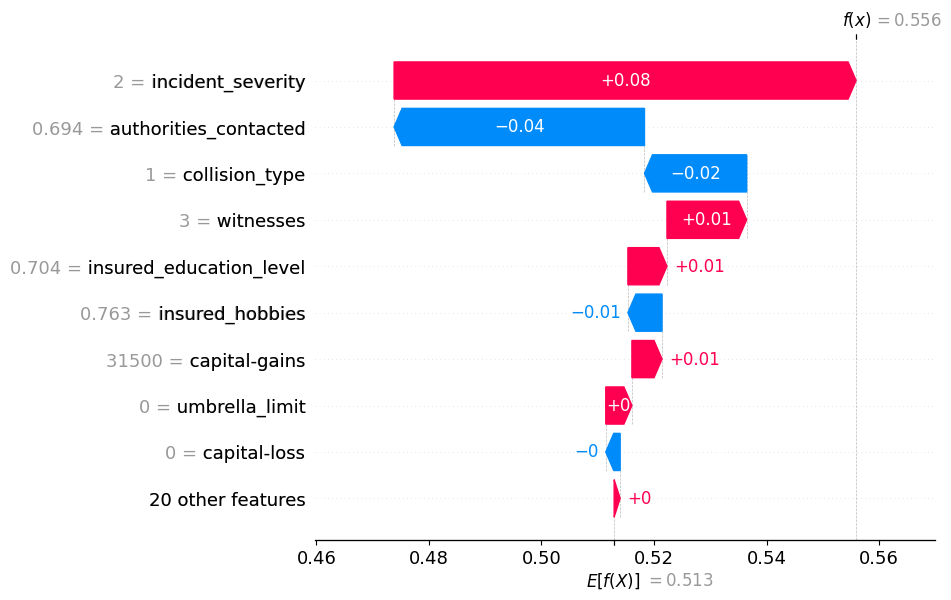

In [59]:
import lime
import lime.lime_tabular
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np

# Assuming X_train_resampled, y_train_resampled, X_test, y_test are already defined

# Pipeline oluştur (Ölçeklendirme + Random Forest)
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Hiperparametre ızgarası
param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [10, 20, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# GridSearchCV ile en iyi modeli bul
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_resampled, y_train_resampled)

# En iyi parametreleri göster
print("En İyi Hiperparametreler:", grid_search.best_params_)

# En iyi modeli al
best_model = grid_search.best_estimator_

# Test seti üzerinde tahmin yap
y_pred = best_model.predict(X_test)

# Sınıflandırma raporu
classification_rep = classification_report(y_test, y_pred)

# Doğruluk oranı
accuracy = accuracy_score(y_test, y_pred)

# Karışıklık matrisi (Confusion Matrix)
conf_matrix = confusion_matrix(y_test, y_pred)

# Sonuçları yazdır
print("\nClassification Report:\n", classification_rep)
print("\nAccuracy Score:", accuracy)
print("\nConfusion Matrix:\n", conf_matrix)

# LIME Explanation
# Initialize the LIME explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=['NO', 'YES'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer_lime.explain_instance(
    data_row=instance,
    predict_fn=best_model.predict_proba,
    num_features=10
)

# Visualize the LIME explanation
exp.show_in_notebook()

# SHAP Explanation
import shap

# Initialize the SHAP explainer
explainer_shap = shap.Explainer(best_model.named_steps['classifier'], X_train_resampled)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[[instance_index]]  # SHAP requires 2D input

# Calculate SHAP values for the instance
shap_values = explainer_shap(instance)

# Get the index of the positive class (class 1 or 'YES')
class_index = list(best_model.named_steps['classifier'].classes_).index(1)

# Extract SHAP values for the positive class (class 1)
shap_value_for_class_1 = shap_values[..., class_index]

# Ensure the SHAP values are in the correct format (1D array)
shap_value_for_class_1 = shap_value_for_class_1[0]  # Select the first (and only) instance

# Create an Explanation object for the waterfall plot
shap_explanation = shap.Explanation(
    values=shap_value_for_class_1.values,  # SHAP values for the instance
    base_values=shap_value_for_class_1.base_values,  # Base value for the positive class
    data=instance.values[0],  # Instance data
    feature_names=X_train_resampled.columns  # Feature names
)

# Visualize the SHAP waterfall plot for the positive class
shap.plots.waterfall(shap_explanation, max_display=10)

## XGBoost

In [60]:
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
from lime import lime_tabular
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap

# Assuming X_train, X_test, y_train, y_test are already defined

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames to preserve column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# XGBoost model
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')

# Train the model
xgb_model.fit(X_train_scaled_df, y_train_resampled)

# Predictions
y_pred_xgb = xgb_model.predict(X_test_scaled_df)
y_pred_proba_xgb = xgb_model.predict_proba(X_test_scaled_df)

# Model Evaluation
print("XGBoost Model's Test Set Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("XGBoost Classification Report:\n", classification_report(y_test, y_pred_xgb))


# LIME Explanation
explainer_lime = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_scaled_df),
    feature_names=X_train_scaled_df.columns,
    class_names=['No', 'Yes'],  # Adjust based on your classes
    mode='classification'
)

# Choose an instance to explain
instance_index = 0
instance = X_test_scaled_df.iloc[instance_index]

# Explain the prediction
exp = explainer_lime.explain_instance(
    data_row=instance,
    predict_fn=xgb_model.predict_proba,
    num_features=10
)

# Visualize LIME explanation
exp.show_in_notebook()

# SHAP Explanation
# Initialize SHAP explainer directly with XGBoost model
explainer_shap = shap.TreeExplainer(xgb_model)

# Calculate SHAP values for the instance
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]
shap_values = explainer_shap.shap_values(instance_for_shap)

# If the model outputs probabilities for two classes, shap_values will be a list with two arrays
# We'll use the values for the positive class (index 1)
if isinstance(shap_values, list):
    shap_values_to_plot = shap_values[1][0]  # Values for positive class
else:
    shap_values_to_plot = shap_values[0]  # If single array is returned

# Create the waterfall plot
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_to_plot,
        base_values=explainer_shap.expected_value[1] if isinstance(explainer_shap.expected_value, list) else explainer_shap.expected_value,
        data=instance_for_shap.iloc[0],
        feature_names=X_test_scaled_df.columns
    )
)



XGBoost Model's Test Set Accuracy: 0.84
XGBoost Classification Report:
               precision    recall  f1-score   support

         0.0       0.69      0.63      0.66        49
         1.0       0.88      0.91      0.90       151

    accuracy                           0.84       200
   macro avg       0.79      0.77      0.78       200
weighted avg       0.84      0.84      0.84       200



RuntimeError: SHAP requires XGBoost >= v1.6 , but found version 1.4.2. Please upgrade XGBoost.

## Logistic

#### WITHOUT HYPERPARAMATER TUNING 

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression model
log_reg_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the Logistic Regression model
log_reg_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = log_reg_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


#### WITH HYPERPARAMETER TUNING

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import lime
import lime.lime_tabular
import shap

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames with original column names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Logistic Regression model
log_reg_model = LogisticRegression(random_state=42, max_iter=1000)

# Hyperparameter tuning for Logistic Regression using GridSearchCV
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'saga'],  # Solvers for small datasets
    'penalty': ['l2'],  # Regularization type
    'max_iter': [100, 500, 1000],  # Maximum number of iterations
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=log_reg_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# Get the best model from grid search
best_log_reg_model = grid_search.best_estimator_

# Predict using the test set
y_pred = best_log_reg_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Display the best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)



# LIME Explanation
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=['No', 'Yes'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn=best_log_reg_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()

# SHAP Explanation
explainer_shap = shap.Explainer(best_log_reg_model, X_train_scaled)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test_scaled.iloc[instance_index:instance_index+1]  # SHAP requires 2D input

# Calculate SHAP values for the instance
shap_values = explainer_shap(instance)

# Visualize the SHAP values
shap.plots.waterfall(shap_values[0], max_display=10)

## KNN

#### WITHOUT HYPERPARAMETER TUNING 

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# K-Nearest Neighbors model
knn_model = KNeighborsClassifier()

# Train the KNN model
knn_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = knn_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


#### WITH HYPERPARAMETER TUNING

Fitting 3 folds for each of 60 candidates, totalling 180 fits
Model's Test Set Accuracy: 0.685
Classification Report:
               precision    recall  f1-score   support

         0.0       0.37      0.39      0.38        49
         1.0       0.80      0.78      0.79       151

    accuracy                           0.69       200
   macro avg       0.58      0.58      0.58       200
weighted avg       0.69      0.69      0.69       200

Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 9, 'p': 1, 'weights': 'distance'}


  0%|          | 0/1 [00:00<?, ?it/s]

SHAP values shape: (1, 29)


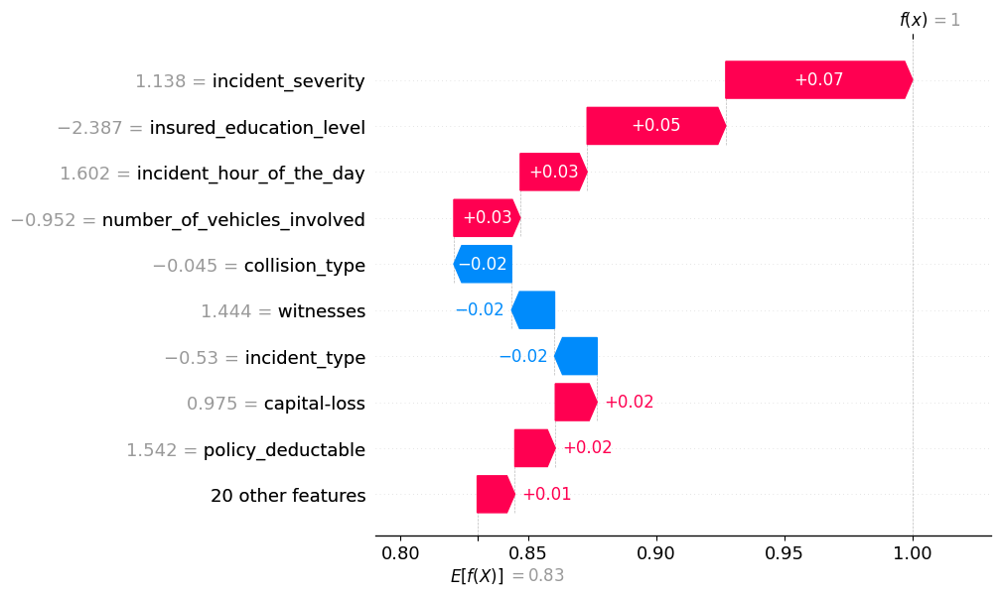

In [65]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# K-Nearest Neighbors model
knn_model = KNeighborsClassifier()

# Hyperparameter tuning for KNN using GridSearchCV
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Number of neighbors
    'weights': ['uniform', 'distance'],  # Weighting method
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metric
    'p': [1, 2]  # Power parameter for the Minkowski distance
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=knn_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# Get the best model from grid search
best_knn_model = grid_search.best_estimator_

# Predict using the test set
y_pred = best_knn_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Display the best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)



from lime import lime_tabular
# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=['No', 'Yes'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn=best_knn_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()


import shap
import pandas as pd
import numpy as np

# 1. DataFrame oluşturma (özellik isimlerini korumak için)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_train_resampled.columns)

# 2. Pozitif sınıfın (örneğin, "YES" için) olasılığını döndüren özel fonksiyonu tanımlayın:
def predict_positive(X):
    # Bu fonksiyon VotingClassifier'ın predict_proba çıktısında pozitif sınıfı (index 1) döndürür.
    return best_knn_model.predict_proba(X)[:, 1]

# 3. KernelExplainer için background (arka plan) verisi seçimi (örneğin, eğitim verisinden 100 örnek)
background = X_train_scaled_df.iloc[:100].values

# 4. KernelExplainer'ı, özel predict fonksiyonu ile başlatın:
explainer_shap = shap.KernelExplainer(predict_positive, background)

# 5. Açıklamak istediğiniz örneği seçin (tek satırlık DataFrame olarak):
instance_index = 0
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]  # Şekli (1, n_features) olan DataFrame

# 6. SHAP değerlerini hesaplayın:
shap_values = explainer_shap.shap_values(instance_for_shap.values)
# Şu çıktıyı kontrol edin:
print("SHAP values shape:", np.array(shap_values).shape)
# Beklenen: eğer custom fonksiyon doğru çalışıyorsa, shap_values.shape ≈ (1, n_features)
  
# 7. Eğer shap_values liste olarak geliyorsa (multi-output durumunda), pozitif sınıfı seçelim:
if isinstance(shap_values, list):
    # İlk (ve tek) örneğin açıklama vektörünü alalım:
    shap_values_to_plot = shap_values[0][0]
else:
    shap_values_to_plot = shap_values[0]

# 8. expected_value (beklenen çıktı) da custom fonksiyon için tek bir skaler olmalı:
expected_value = explainer_shap.expected_value
if isinstance(expected_value, (list, np.ndarray)):
    expected_value = expected_value[0]

# 9. SHAP Explanation nesnesini oluşturun:
expl = shap.Explanation(
    values=shap_values_to_plot,                     # Şeklinin (n_features,) olduğundan emin olun
    base_values=expected_value,                     # Tek bir skaler
    data=instance_for_shap.iloc[0].values,          # Açıklanan örneğin özellik değerleri (1D array)
    feature_names=X_train_scaled_df.columns
)

# 10. Eğer açıklamanın values kısmı hâlâ çok boyutlu (örneğin, shape (n_features, 2)) ise,
#     ilk sütunu seçelim. Bu durumda aşağıdaki kodu kullanabilirsiniz:
if expl.values.ndim > 1 and expl.values.shape[1] > 1:
    expl = shap.Explanation(
        values=expl.values[:, 0],                     # İlk sütunu seçiyoruz
        base_values=expl.base_values[0] if isinstance(expl.base_values, np.ndarray) and expl.base_values.ndim > 0 else expl.base_values,
        data=expl.data,
        feature_names=expl.feature_names
    )

# 11. (Opsiyonel) JavaScript tabanlı SHAP görselleştirmeleri için:
shap.initjs()

# 12. Waterfall plot oluşturma:
shap.plots.waterfall(expl)




## ADABOOST

#### AdaBoost without Hyperparameter Tuning

In [66]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# AdaBoost model
adaboost_model = AdaBoostClassifier(random_state=42)

# Train the AdaBoost model
adaboost_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = adaboost_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Model's Test Set Accuracy: 0.845
Classification Report:
               precision    recall  f1-score   support

         0.0       0.74      0.57      0.64        49
         1.0       0.87      0.93      0.90       151

    accuracy                           0.84       200
   macro avg       0.80      0.75      0.77       200
weighted avg       0.84      0.84      0.84       200



#### AdaBoost with Hyperparameter Tuning 

Fitting 10 folds for each of 16 candidates, totalling 160 fits


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R

Model's Test Set Accuracy: 0.86
Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.80      0.74        49
         1.0       0.93      0.88      0.90       151

    accuracy                           0.86       200
   macro avg       0.81      0.84      0.82       200
weighted avg       0.87      0.86      0.86       200

Best Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 100}


  0%|          | 0/1 [00:00<?, ?it/s]

SHAP values shape: (1, 29)


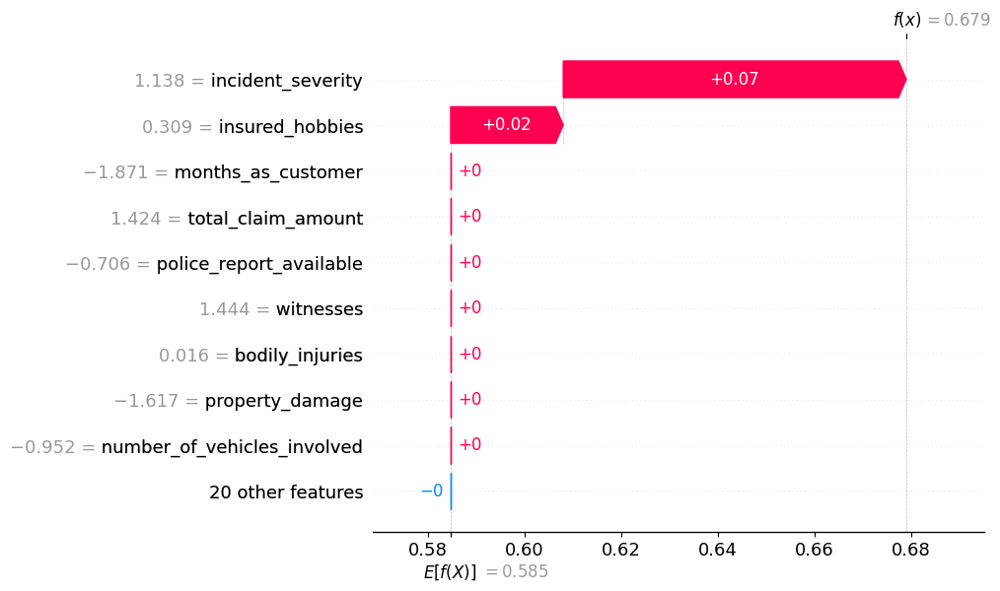

In [67]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import shap
# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# AdaBoost model
adaboost_model = AdaBoostClassifier(random_state=42)

# Hyperparameter tuning for AdaBoost using GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150,200],  # Number of weak learners
    'learning_rate': [0.01, 0.1, 0.5, 1.0],  # Step size
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=adaboost_model, param_grid=param_grid, cv=10, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# Get the best model from grid search
best_adaboost_model = grid_search.best_estimator_

# Predict using the test set
y_pred = best_adaboost_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Display the best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)



# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
     class_names=['No', 'Yes'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn= best_adaboost_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()


import shap
import pandas as pd
import numpy as np

# 1. DataFrame oluşturma (özellik isimlerini korumak için)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_train_resampled.columns)

# 2. Pozitif sınıfın (örneğin, "YES" için) olasılığını döndüren özel fonksiyonu tanımlayın:
def predict_positive(X):
    # Bu fonksiyon VotingClassifier'ın predict_proba çıktısında pozitif sınıfı (index 1) döndürür.
    return best_adaboost_model.predict_proba(X)[:, 1]

# 3. KernelExplainer için background (arka plan) verisi seçimi (örneğin, eğitim verisinden 100 örnek)
background = X_train_scaled_df.iloc[:100].values

# 4. KernelExplainer'ı, özel predict fonksiyonu ile başlatın:
explainer_shap = shap.KernelExplainer(predict_positive, background)

# 5. Açıklamak istediğiniz örneği seçin (tek satırlık DataFrame olarak):
instance_index = 0
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]  # Şekli (1, n_features) olan DataFrame

# 6. SHAP değerlerini hesaplayın:
shap_values = explainer_shap.shap_values(instance_for_shap.values)
# Şu çıktıyı kontrol edin:
print("SHAP values shape:", np.array(shap_values).shape)
# Beklenen: eğer custom fonksiyon doğru çalışıyorsa, shap_values.shape ≈ (1, n_features)
  
# 7. Eğer shap_values liste olarak geliyorsa (multi-output durumunda), pozitif sınıfı seçelim:
if isinstance(shap_values, list):
    # İlk (ve tek) örneğin açıklama vektörünü alalım:
    shap_values_to_plot = shap_values[0][0]
else:
    shap_values_to_plot = shap_values[0]

# 8. expected_value (beklenen çıktı) da custom fonksiyon için tek bir skaler olmalı:
expected_value = explainer_shap.expected_value
if isinstance(expected_value, (list, np.ndarray)):
    expected_value = expected_value[0]

# 9. SHAP Explanation nesnesini oluşturun:
expl = shap.Explanation(
    values=shap_values_to_plot,                     # Şeklinin (n_features,) olduğundan emin olun
    base_values=expected_value,                     # Tek bir skaler
    data=instance_for_shap.iloc[0].values,          # Açıklanan örneğin özellik değerleri (1D array)
    feature_names=X_train_scaled_df.columns
)

# 10. Eğer açıklamanın values kısmı hâlâ çok boyutlu (örneğin, shape (n_features, 2)) ise,
#     ilk sütunu seçelim. Bu durumda aşağıdaki kodu kullanabilirsiniz:
if expl.values.ndim > 1 and expl.values.shape[1] > 1:
    expl = shap.Explanation(
        values=expl.values[:, 0],                     # İlk sütunu seçiyoruz
        base_values=expl.base_values[0] if isinstance(expl.base_values, np.ndarray) and expl.base_values.ndim > 0 else expl.base_values,
        data=expl.data,
        feature_names=expl.feature_names
    )

# 11. (Opsiyonel) JavaScript tabanlı SHAP görselleştirmeleri için:
shap.initjs()

# 12. Waterfall plot oluşturma:
shap.plots.waterfall(expl)


## SVM

#### SVM with Hyperparameter Tuning

In [68]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import numpy as np

# varsayalım ki X_train_resampled, y_train_resampled, X_test, y_test verileriniz tanımlı

# 1. Özelliklerin ölçeklendirilmesi (standardization)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# 2. Support Vector Machine modeli
svm_model = SVC(random_state=42)

# 3. Hiperparametre ızgarası (örnek; ihtiyaca göre düzenleyebilirsiniz)
param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto', 0.1, 1],
    'degree': [3, 4, 5]
}

# 4. GridSearchCV ile hiperparametre ayarlaması (10 katlı çapraz doğrulama kullanılarak)
grid_search = GridSearchCV(estimator=svm_model, 
                           param_grid=param_grid, 
                           cv=10, 
                           scoring='accuracy', 
                           verbose=2, 
                           n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# 5. En iyi modeli elde et
best_svm_model = grid_search.best_estimator_

# 6. Test seti üzerinde tahmin ve değerlendirme
y_pred = best_svm_model.predict(X_test_scaled)
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Best Hyperparameters:", grid_search.best_params_)

# 7. Ek olarak, eğitim verisi üzerinde çapraz doğrulama uygulayalım
# StratifiedKFold kullanarak sınıf dağılımını korumak faydalıdır.
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_svm_model, X_train_scaled, y_train_resampled, cv=cv, scoring='accuracy')

print("Cross-validation scores:", cv_scores)
print("Mean cross-validation accuracy: {:.4f}".format(cv_scores.mean()))


Fitting 10 folds for each of 192 candidates, totalling 1920 fits
[CV] END ..C=0.1, max_iter=100, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=500, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ..C=0.1, max_iter=500, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END .C=0.1, max_iter=1000, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ....C=1, max_iter=100, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END .........C=1, max_iter=100, penalty=l2, solver=saga; total time=   0.0s
[CV] END ...C=1, max_iter=1000, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ........C=1, max_iter=1000, penalty=l2, solver=saga; total time=   0.0s
[CV] END ...C=10, max_iter=500, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ...C=10, max_iter=500, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ..C=10, max_iter=1000, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ..C=100, max_iter=100, penalty=l2, 

#### SVM without Hyperparameter Tuning

Model's Test Set Accuracy: 0.825
Classification Report:
               precision    recall  f1-score   support

         0.0       0.73      0.45      0.56        49
         1.0       0.84      0.95      0.89       151

    accuracy                           0.82       200
   macro avg       0.79      0.70      0.72       200
weighted avg       0.81      0.82      0.81       200



  0%|          | 0/1 [00:00<?, ?it/s]

SHAP values shape: (1, 29)


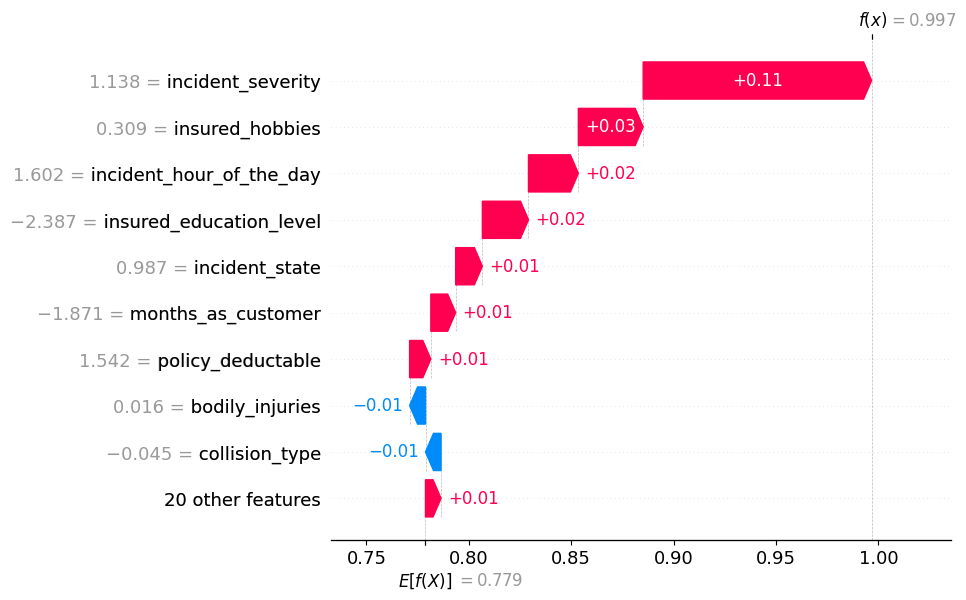

In [69]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Support Vector Machine model with probability enabled
svm_model = SVC(random_state=42, probability=True)  # Set probability=True

# Train the Support Vector Machine model
svm_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = svm_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt


# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=np.unique(y_train_resampled),
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn= svm_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()


import shap
import pandas as pd
import numpy as np

# 1. DataFrame oluşturma (özellik isimlerini korumak için)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_train_resampled.columns)

# 2. Pozitif sınıfın (örneğin, "YES" için) olasılığını döndüren özel fonksiyonu tanımlayın:
def predict_positive(X):
    # Bu fonksiyon VotingClassifier'ın predict_proba çıktısında pozitif sınıfı (index 1) döndürür.
    return svm_model.predict_proba(X)[:, 1]

# 3. KernelExplainer için background (arka plan) verisi seçimi (örneğin, eğitim verisinden 100 örnek)
background = X_train_scaled_df.iloc[:100].values

# 4. KernelExplainer'ı, özel predict fonksiyonu ile başlatın:
explainer_shap = shap.KernelExplainer(predict_positive, background)

# 5. Açıklamak istediğiniz örneği seçin (tek satırlık DataFrame olarak):
instance_index = 0
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]  # Şekli (1, n_features) olan DataFrame

# 6. SHAP değerlerini hesaplayın:
shap_values = explainer_shap.shap_values(instance_for_shap.values)
# Şu çıktıyı kontrol edin:
print("SHAP values shape:", np.array(shap_values).shape)
# Beklenen: eğer custom fonksiyon doğru çalışıyorsa, shap_values.shape ≈ (1, n_features)
  
# 7. Eğer shap_values liste olarak geliyorsa (multi-output durumunda), pozitif sınıfı seçelim:
if isinstance(shap_values, list):
    # İlk (ve tek) örneğin açıklama vektörünü alalım:
    shap_values_to_plot = shap_values[0][0]
else:
    shap_values_to_plot = shap_values[0]

# 8. expected_value (beklenen çıktı) da custom fonksiyon için tek bir skaler olmalı:
expected_value = explainer_shap.expected_value
if isinstance(expected_value, (list, np.ndarray)):
    expected_value = expected_value[0]

# 9. SHAP Explanation nesnesini oluşturun:
expl = shap.Explanation(
    values=shap_values_to_plot,                     # Şeklinin (n_features,) olduğundan emin olun
    base_values=expected_value,                     # Tek bir skaler
    data=instance_for_shap.iloc[0].values,          # Açıklanan örneğin özellik değerleri (1D array)
    feature_names=X_train_scaled_df.columns
)

# 10. Eğer açıklamanın values kısmı hâlâ çok boyutlu (örneğin, shape (n_features, 2)) ise,
#     ilk sütunu seçelim. Bu durumda aşağıdaki kodu kullanabilirsiniz:
if expl.values.ndim > 1 and expl.values.shape[1] > 1:
    expl = shap.Explanation(
        values=expl.values[:, 0],                     # İlk sütunu seçiyoruz
        base_values=expl.base_values[0] if isinstance(expl.base_values, np.ndarray) and expl.base_values.ndim > 0 else expl.base_values,
        data=expl.data,
        feature_names=expl.feature_names
    )

# 11. (Opsiyonel) JavaScript tabanlı SHAP görselleştirmeleri için:
shap.initjs()

# 12. Waterfall plot oluşturma:
shap.plots.waterfall(expl)



## GNB

#### GNB without Hyperparameter Tuning

In [70]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Gaussian Naive Bayes model
gnb_model = GaussianNB()

# Train the Gaussian Naive Bayes model
gnb_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = gnb_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Model's Test Set Accuracy: 0.725
Classification Report:
               precision    recall  f1-score   support

         0.0       0.47      0.84      0.60        49
         1.0       0.93      0.69      0.79       151

    accuracy                           0.72       200
   macro avg       0.70      0.76      0.69       200
weighted avg       0.82      0.72      0.74       200



#### GNB with Hyperparameter Tuning

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Model's Test Set Accuracy: 0.725
Classification Report:
               precision    recall  f1-score   support

         0.0       0.47      0.84      0.60        49
         1.0       0.93      0.69      0.79       151

    accuracy                           0.72       200
   macro avg       0.70      0.76      0.69       200
weighted avg       0.82      0.72      0.74       200

Best Hyperparameters: {'var_smoothing': 1e-09}


  0%|          | 0/1 [00:00<?, ?it/s]

SHAP values shape: (1, 29)


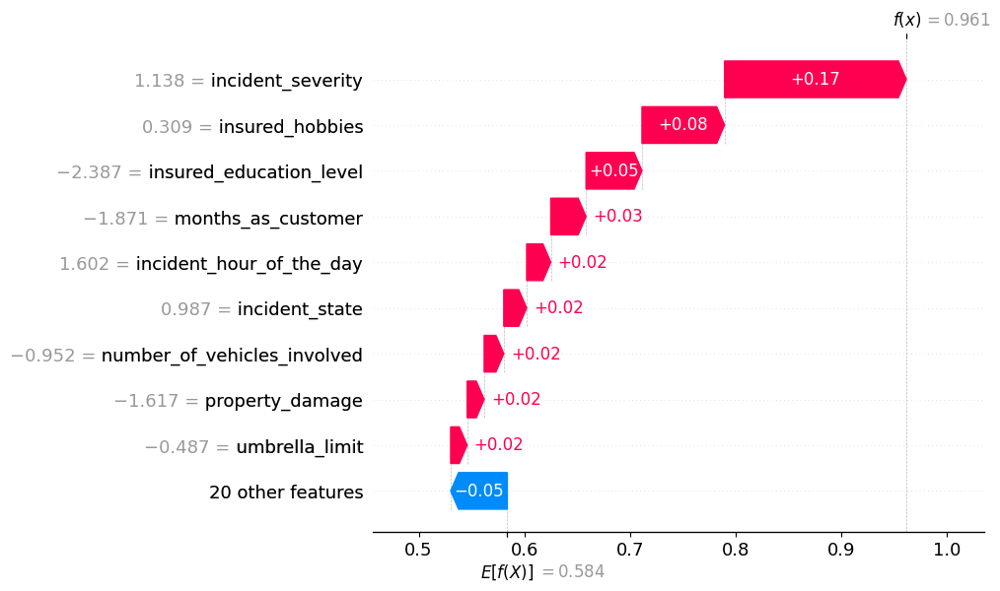

In [71]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Gaussian Naive Bayes model
gnb_model = GaussianNB()

# Hyperparameter tuning for GNB using GridSearchCV
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]  # Smoothing parameter to handle 0 variance features
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=gnb_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# Get the best model from grid search
best_gnb_model = grid_search.best_estimator_

# Predict using the test set
y_pred = best_gnb_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Display the best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)


# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=['No', 'Yes'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn= best_gnb_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()


import shap
import pandas as pd
import numpy as np

# 1. DataFrame oluşturma (özellik isimlerini korumak için)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_train_resampled.columns)

# 2. Pozitif sınıfın (örneğin, "YES" için) olasılığını döndüren özel fonksiyonu tanımlayın:
def predict_positive(X):
    # Bu fonksiyon VotingClassifier'ın predict_proba çıktısında pozitif sınıfı (index 1) döndürür.
    return best_gnb_model.predict_proba(X)[:, 1]

# 3. KernelExplainer için background (arka plan) verisi seçimi (örneğin, eğitim verisinden 100 örnek)
background = X_train_scaled_df.iloc[:100].values

# 4. KernelExplainer'ı, özel predict fonksiyonu ile başlatın:
explainer_shap = shap.KernelExplainer(predict_positive, background)

# 5. Açıklamak istediğiniz örneği seçin (tek satırlık DataFrame olarak):
instance_index = 0
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]  # Şekli (1, n_features) olan DataFrame

# 6. SHAP değerlerini hesaplayın:
shap_values = explainer_shap.shap_values(instance_for_shap.values)
# Şu çıktıyı kontrol edin:
print("SHAP values shape:", np.array(shap_values).shape)
# Beklenen: eğer custom fonksiyon doğru çalışıyorsa, shap_values.shape ≈ (1, n_features)
  
# 7. Eğer shap_values liste olarak geliyorsa (multi-output durumunda), pozitif sınıfı seçelim:
if isinstance(shap_values, list):
    # İlk (ve tek) örneğin açıklama vektörünü alalım:
    shap_values_to_plot = shap_values[0][0]
else:
    shap_values_to_plot = shap_values[0]

# 8. expected_value (beklenen çıktı) da custom fonksiyon için tek bir skaler olmalı:
expected_value = explainer_shap.expected_value
if isinstance(expected_value, (list, np.ndarray)):
    expected_value = expected_value[0]

# 9. SHAP Explanation nesnesini oluşturun:
expl = shap.Explanation(
    values=shap_values_to_plot,                     # Şeklinin (n_features,) olduğundan emin olun
    base_values=expected_value,                     # Tek bir skaler
    data=instance_for_shap.iloc[0].values,          # Açıklanan örneğin özellik değerleri (1D array)
    feature_names=X_train_scaled_df.columns
)

# 10. Eğer açıklamanın values kısmı hâlâ çok boyutlu (örneğin, shape (n_features, 2)) ise,
#     ilk sütunu seçelim. Bu durumda aşağıdaki kodu kullanabilirsiniz:
if expl.values.ndim > 1 and expl.values.shape[1] > 1:
    expl = shap.Explanation(
        values=expl.values[:, 0],                     # İlk sütunu seçiyoruz
        base_values=expl.base_values[0] if isinstance(expl.base_values, np.ndarray) and expl.base_values.ndim > 0 else expl.base_values,
        data=expl.data,
        feature_names=expl.feature_names
    )

# 11. (Opsiyonel) JavaScript tabanlı SHAP görselleştirmeleri için:
shap.initjs()

# 12. Waterfall plot oluşturma:
shap.plots.waterfall(expl)



## DT

#### Decision Tree with Hyperparameter Tuning

In [72]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Train the Decision Tree model
dt_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = dt_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Model's Test Set Accuracy: 0.81
Classification Report:
               precision    recall  f1-score   support

         0.0       0.62      0.57      0.60        49
         1.0       0.86      0.89      0.88       151

    accuracy                           0.81       200
   macro avg       0.74      0.73      0.74       200
weighted avg       0.81      0.81      0.81       200



#### Decision Tree without Hyperparameter Tuning

Fitting 3 folds for each of 90 candidates, totalling 270 fits
[CV] END ....C=1, max_iter=500, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ....C=1, max_iter=500, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END ........C=1, max_iter=1000, penalty=l2, solver=saga; total time=   0.0s
[CV] END ........C=1, max_iter=1000, penalty=l2, solver=saga; total time=   0.0s
[CV] END ..C=10, max_iter=1000, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END .......C=10, max_iter=1000, penalty=l2, solver=saga; total time=   0.0s
[CV] END .C=100, max_iter=1000, penalty=l2, solver=liblinear; total time=   0.0s
[CV] END metric=manhattan, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END metric=manhattan, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END metric=manhattan, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END metric=manhattan, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END metric=manhattan, n_neighbor

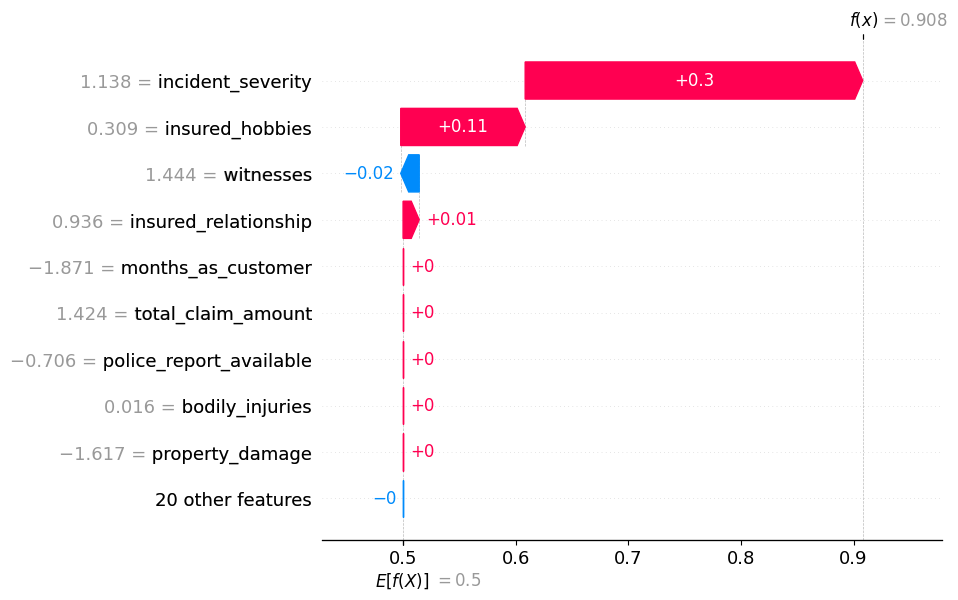

In [73]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve
import lime
import lime.lime_tabular
import shap

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Hyperparameter tuning for Decision Tree using GridSearchCV
param_grid = {
    'max_depth': [3, 5, 7, 10, None],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum samples required at a leaf node
    'criterion': ['gini', 'entropy'],  # Splitting criterion
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=dt_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# Get the best model from grid search
best_dt_model = grid_search.best_estimator_

# Predict using the test set
y_pred = best_dt_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Display the best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)


# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=['NO', 'YES'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn=best_dt_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()


# SHAP Explanation
explainer_shap = shap.TreeExplainer(best_dt_model)

# Burada, X_test_scaled_df'nin X_test_scaled'den DataFrame olarak oluşturulduğunu varsayıyoruz.
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]  # DataFrame olarak 1 satır
shap_values = explainer_shap.shap_values(instance_for_shap)

# SHAP değerlerinin yapısını kontrol edelim:
# - Eğer shap_values bir liste ise (genellikle binary classification için liste döner):
if isinstance(shap_values, list):
    # Pozitif sınıf (index 1) için açıklama vektörünü alıyoruz:
    shap_values_to_plot = shap_values[1][0]  # shap_values[1] -> (n_samples, n_features); [0] ile ilk örneği seçiyoruz.
else:
    # Eğer shap_values bir NumPy dizisi olarak döndüyse (örneğin shape: (1, n_features, n_classes)):
    # Pozitif sınıf (index 1) için açıklama vektörünü alıyoruz:
    shap_values_to_plot = shap_values[0, :, 1]  # 0: ilk örnek, : tüm özellikler, 1: pozitif sınıf

# expected_value'yi de pozitif sınıfa göre seçelim:
if isinstance(explainer_shap.expected_value, (list, np.ndarray)):
    expected_value = explainer_shap.expected_value[1]
else:
    expected_value = explainer_shap.expected_value

# Waterfall plot oluşturulması:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_to_plot,
        base_values=expected_value,
        data=instance_for_shap.iloc[0],  # 1 satırlık DataFrame'den Series elde ediyoruz.
        feature_names=X_test_scaled_df.columns
    )
)


## Gradient Boosting

#### Gradient Boosting without Hyperparameter Tuning

In [74]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Train the Gradient Boosting model
gb_model.fit(X_train_scaled, y_train_resampled)

# Predict using the test set
y_pred = gb_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Model's Test Set Accuracy: 0.845
Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.63      0.67        49
         1.0       0.88      0.91      0.90       151

    accuracy                           0.84       200
   macro avg       0.79      0.77      0.78       200
weighted avg       0.84      0.84      0.84       200



#### Gradient Boosting with Hyperparameter Tuning

Fitting 3 folds for each of 144 candidates, totalling 432 fits
Model's Test Set Accuracy: 0.855
Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.78      0.72        49
         1.0       0.92      0.88      0.90       151

    accuracy                           0.85       200
   macro avg       0.80      0.83      0.81       200
weighted avg       0.86      0.85      0.86       200

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 150, 'subsample': 0.9}


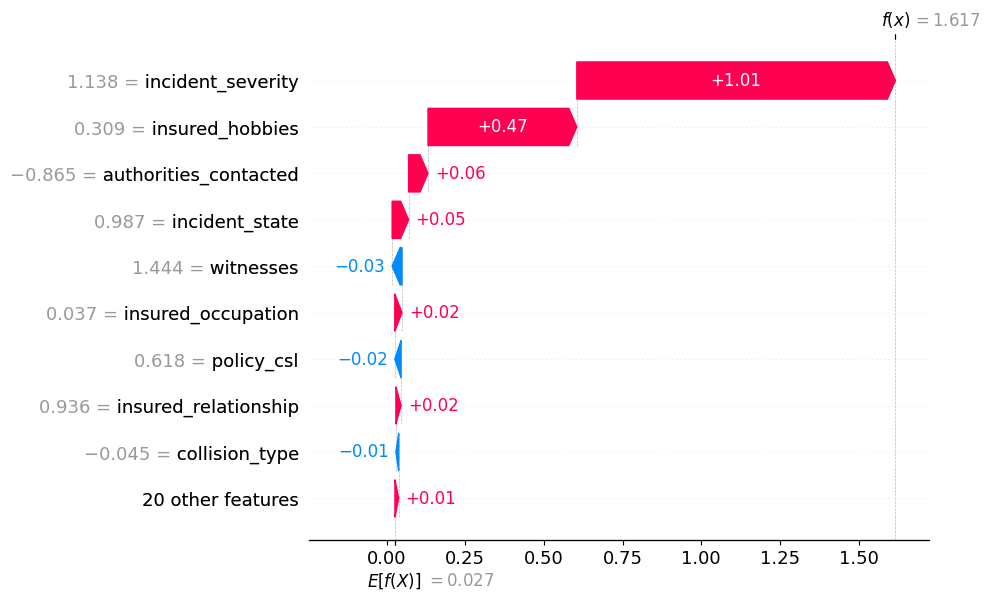

In [77]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Hyperparameter tuning for Gradient Boosting using GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150],  # Number of boosting stages
    'learning_rate': [0.01, 0.05, 0.1, 0.3],  # Step size to prevent overfitting
    'max_depth': [3, 5, 7],  # Maximum depth of the individual trees
    'subsample': [0.7, 0.8, 0.9, 1.0],  # Fraction of samples used to fit each base learner
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_resampled)

# Get the best model from grid search
best_gb_model = grid_search.best_estimator_

# Predict using the test set
y_pred = best_gb_model.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Display the best parameters from GridSearchCV
print("Best Hyperparameters:", grid_search.best_params_)


# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=X_train_resampled.columns,
    class_names=['NO', 'YES'],
    mode='classification'
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test.iloc[instance_index]

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn= best_gb_model.predict_proba,
    num_features=10
)

# Visualize the explanation
exp.show_in_notebook()


# SHAP Explanation
# Initialize SHAP explainer directly with DT model
explainer_shap = shap.TreeExplainer(best_gb_model)

# Calculate SHAP values for the instance
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]
shap_values = explainer_shap.shap_values(instance_for_shap)

# If the model outputs probabilities for two classes, shap_values will be a list with two arrays
# We'll use the values for the positive class (index 1)
if isinstance(shap_values, list):
    shap_values_to_plot = shap_values[1][0]  # Values for positive class
else:
    shap_values_to_plot = shap_values[0]  # If single array is returned

# Create the waterfall plot
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_to_plot,
        base_values=explainer_shap.expected_value[1] if isinstance(explainer_shap.expected_value, list) else explainer_shap.expected_value,
        data=instance_for_shap.iloc[0],
        feature_names=X_test_scaled_df.columns
    )
)

## Voting Classifier

Model's Test Set Accuracy: 0.865
Classification Report:
               precision    recall  f1-score   support

         0.0       0.73      0.71      0.72        49
         1.0       0.91      0.91      0.91       151

    accuracy                           0.86       200
   macro avg       0.82      0.81      0.82       200
weighted avg       0.86      0.86      0.86       200



  0%|          | 0/1 [00:00<?, ?it/s]

SHAP values shape: (1, 29)


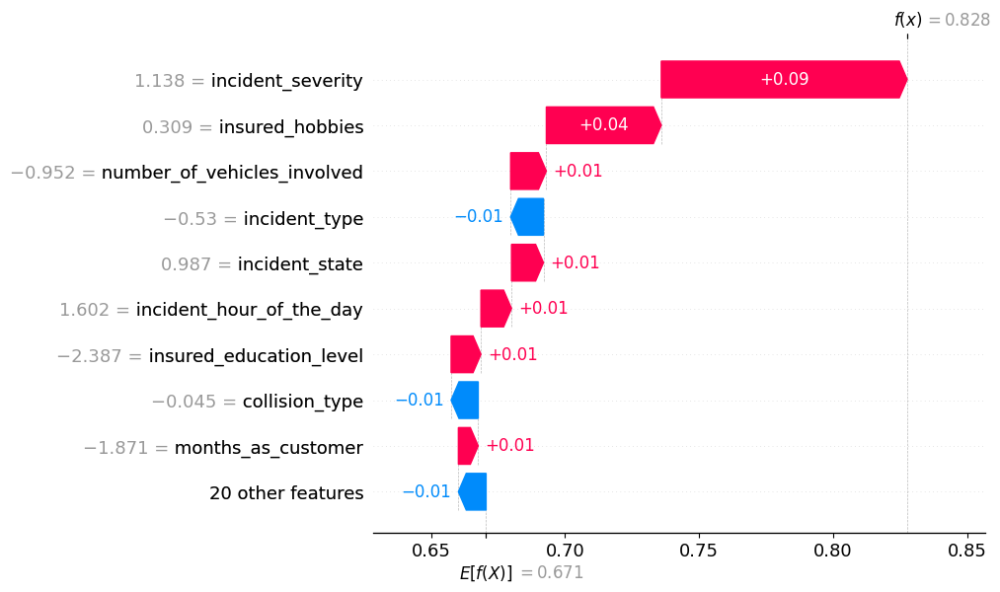

In [61]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve

# Scaling the features (standardization)
scaler = StandardScaler()

# Scaling the training and test sets
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Initialize the models
adaboost_model = AdaBoostClassifier(random_state=42)
gnb_model = GaussianNB()
gb_model = GradientBoostingClassifier(random_state=42)
rf_model = RandomForestClassifier(random_state=42)  # Add Random Forest Classifier

# Create the Voting Classifier (using soft voting)
voting_clf = VotingClassifier(estimators=[
    ('adaboost', adaboost_model),
    ('gnb', gnb_model),
    ('gradient_boosting', gb_model),
    ('random_forest', rf_model)  # Add Random Forest to the ensemble
], voting='soft')  # Use 'soft' for averaging probabilities

# Train the Voting Classifier
voting_clf.fit(X_train_scaled, y_train_resampled)

# Predict using the Voting Classifier on the test set
y_pred = voting_clf.predict(X_test_scaled)

# Evaluate the model
print("Model's Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


# LIME Explanation
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_scaled),  # Scaled training data
    feature_names=X_train_resampled.columns,  # Feature names
    class_names=['NO', 'YES'],               # Map 0 to 'NO' and 1 to 'YES'
    mode='classification'                    # Classification task
)

# Choose an instance to explain
instance_index = 0  # You can change this to any index in your test set
instance = X_test_scaled[instance_index]  # Scaled test instance

# Explain the prediction for the chosen instance
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn=voting_clf.predict_proba,  # Use the VotingClassifier's predict_proba function
    num_features=10                       # Number of features to display
)

# Visualize the explanation
exp.show_in_notebook()

import shap
import pandas as pd
import numpy as np

# 1. DataFrame oluşturma (özellik isimlerini korumak için)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_resampled.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_train_resampled.columns)

# 2. Pozitif sınıfın (örneğin, "YES" için) olasılığını döndüren özel fonksiyonu tanımlayın:
def predict_positive(X):
    # Bu fonksiyon VotingClassifier'ın predict_proba çıktısında pozitif sınıfı (index 1) döndürür.
    return voting_clf.predict_proba(X)[:, 1]

# 3. KernelExplainer için background (arka plan) verisi seçimi (örneğin, eğitim verisinden 100 örnek)
background = X_train_scaled_df.iloc[:100].values

# 4. KernelExplainer'ı, özel predict fonksiyonu ile başlatın:
explainer_shap = shap.KernelExplainer(predict_positive, background)

# 5. Açıklamak istediğiniz örneği seçin (tek satırlık DataFrame olarak):
instance_index = 0
instance_for_shap = X_test_scaled_df.iloc[[instance_index]]  # Şekli (1, n_features) olan DataFrame

# 6. SHAP değerlerini hesaplayın:
shap_values = explainer_shap.shap_values(instance_for_shap.values)
# Şu çıktıyı kontrol edin:
print("SHAP values shape:", np.array(shap_values).shape)
# Beklenen: eğer custom fonksiyon doğru çalışıyorsa, shap_values.shape ≈ (1, n_features)
  
# 7. Eğer shap_values liste olarak geliyorsa (multi-output durumunda), pozitif sınıfı seçelim:
if isinstance(shap_values, list):
    # İlk (ve tek) örneğin açıklama vektörünü alalım:
    shap_values_to_plot = shap_values[0][0]
else:
    shap_values_to_plot = shap_values[0]

# 8. expected_value (beklenen çıktı) da custom fonksiyon için tek bir skaler olmalı:
expected_value = explainer_shap.expected_value
if isinstance(expected_value, (list, np.ndarray)):
    expected_value = expected_value[0]

# 9. SHAP Explanation nesnesini oluşturun:
expl = shap.Explanation(
    values=shap_values_to_plot,                     # Şeklinin (n_features,) olduğundan emin olun
    base_values=expected_value,                     # Tek bir skaler
    data=instance_for_shap.iloc[0].values,          # Açıklanan örneğin özellik değerleri (1D array)
    feature_names=X_train_scaled_df.columns
)

# 10. Eğer açıklamanın values kısmı hâlâ çok boyutlu (örneğin, shape (n_features, 2)) ise,
#     ilk sütunu seçelim. Bu durumda aşağıdaki kodu kullanabilirsiniz:
if expl.values.ndim > 1 and expl.values.shape[1] > 1:
    expl = shap.Explanation(
        values=expl.values[:, 0],                     # İlk sütunu seçiyoruz
        base_values=expl.base_values[0] if isinstance(expl.base_values, np.ndarray) and expl.base_values.ndim > 0 else expl.base_values,
        data=expl.data,
        feature_names=expl.feature_names
    )

# 11. (Opsiyonel) JavaScript tabanlı SHAP görselleştirmeleri için:
shap.initjs()

# 12. Waterfall plot oluşturma:
shap.plots.waterfall(expl)


### ROC-AUC 

X_train shape: (800, 29), y_train_resampled shape: (1204,)
⚠️ Warning: Mismatched shapes detected! Fixing label size issue.
Training model: Gradient Boosting


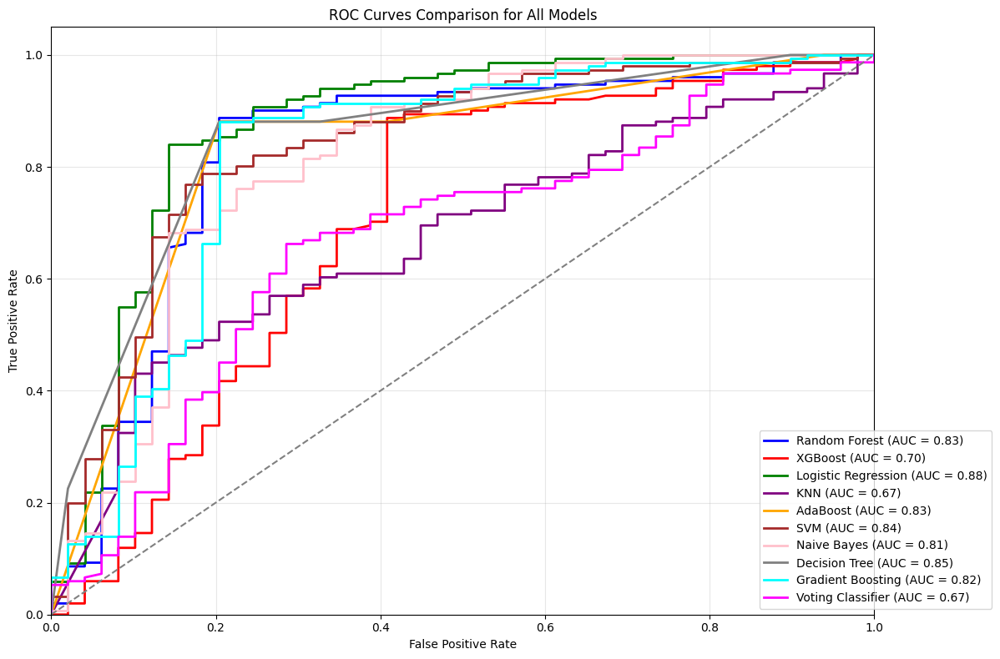

In [79]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Check the shapes of training data
print(f"X_train shape: {X_train.shape}, y_train_resampled shape: {y_train_resampled.shape}")

# Fix mismatched shapes between X_train and y_train_resampled
if len(y_train_resampled) != len(X_train):
    print("⚠️ Warning: Mismatched shapes detected! Fixing label size issue.")
    y_train_resampled = y_train_resampled[:len(X_train)]  # Trim excess labels

# Function to train all models
def fit_models(models_dict, X_train, X_train_scaled, y_train):
    """
    Train models if they are not already trained.
    """
    for name, model in models_dict.items():
        if not hasattr(model, 'classes_'):  # Check if the model is already trained
            try:
                print(f"Training model: {name}")
                if name in ['Logistic Regression', 'KNN', 'SVM', 'AdaBoost', 'Naive Bayes', 'Decision Tree']:
                    model.fit(X_train_scaled, y_train)  # Use scaled data for specific models
                else:
                    model.fit(X_train, y_train)  # Use original data for other models
            except Exception as e:
                print(f" Error training model {name}: {e}")
                models_dict[name] = None  # Replace faulty models with None

# Function to plot ROC curves for all models
def plot_combined_roc_curves(models_dict, X_test, X_test_scaled, y_test):
    """
    Plot ROC curves for multiple models in a single figure.
    """
    plt.figure(figsize=(12, 8))
    colors = ['blue', 'red', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta']
    
    for (name, model), color in zip(models_dict.items(), colors):
        if model is None:  # Skip untrained models
            print(f"Skipping {name} due to training errors.")
            continue

        # Select the appropriate test data (scaled or original)
        X = X_test_scaled if name in ['Logistic Regression', 'KNN', 'SVM', 'AdaBoost', 'Naive Bayes', 'Decision Tree'] else X_test
        
        # Generate predictions for ROC curve
        try:
            if hasattr(model, 'predict_proba'):
                y_pred_proba = model.predict_proba(X)[:, 1]  # Use probability estimates
            elif hasattr(model, 'decision_function'):
                y_pred_proba = model.decision_function(X)  # Use decision function
            else:
                print(f" Model {name} does not support probability predictions.")
                continue
            
            # Calculate ROC curve and AUC
            fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
            roc_auc = roc_auc_score(y_test, y_pred_proba)
            
            # Plot ROC curve
            plt.plot(fpr, tpr, color=color, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')
        
        except Exception as e:
            print(f" Error plotting ROC curve for {name}: {e}")
    
    # Plot the random classifier line
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    
    # Customize the plot
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves Comparison for All Models')
    plt.legend(loc='lower right', bbox_to_anchor=(1.15, 0))
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    return plt

# Dictionary of models (ensure all models are initialized)
models_dict = {
    'Random Forest': best_model,
    'XGBoost': xgb_model,
    'Logistic Regression': best_log_reg_model,
    'KNN': best_knn_model,
    'AdaBoost': best_adaboost_model,
    'SVM': svm_model,
    'Naive Bayes': best_gnb_model,
    'Decision Tree': best_dt_model,  # Use the best Decision Tree model from GridSearchCV
    'Gradient Boosting': gb_model,
    'Voting Classifier': voting_clf 
}

# **Step 1: Train all models**
fit_models(models_dict, X_train, X_train_scaled, y_train_resampled)

# **Step 2: Plot ROC curves for all models**
plt = plot_combined_roc_curves(models_dict, X_test, X_test_scaled, y_test)
plt.show()

### COMPARISON

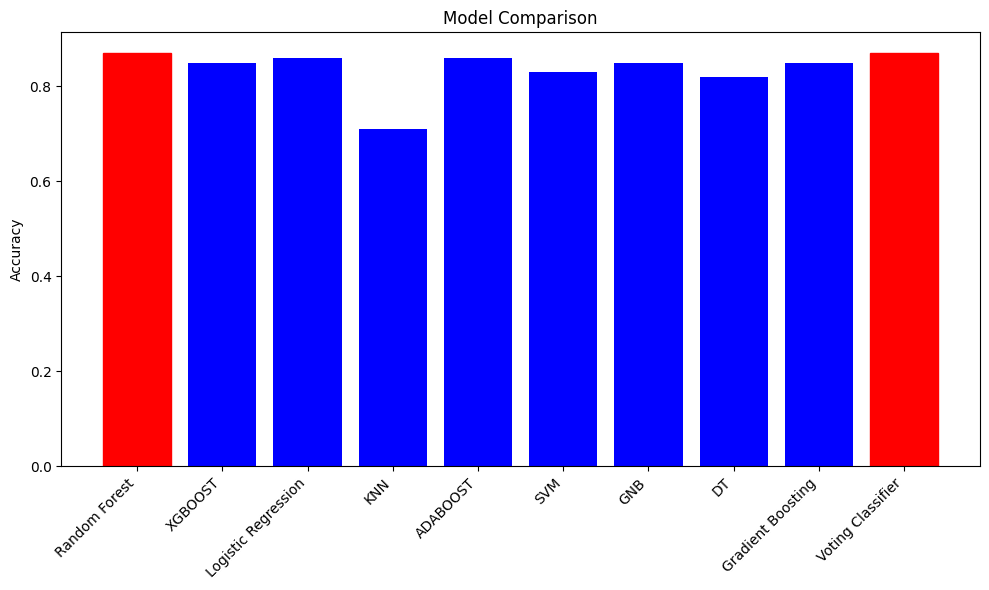

[CV] END .............C=10, degree=4, gamma=1, kernel=linear; total time=   0.2s
[CV] END .............C=10, degree=5, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .............C=10, degree=5, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .............C=10, degree=5, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .............C=10, degree=5, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .............C=10, degree=5, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .............C=10, degree=5, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .........C=10, degree=5, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END .........C=10, degree=5, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END ...........C=10, degree=5, gamma=0.1, kernel=linear; total time=   0.3s
[CV] END ...........C=10, degree=5, gamma=0.1, kernel=linear; total time=   0.3s
[CV] END ...........C=10, degree=5, gamma=0.1, kernel=linear; total time=   0.2s
[CV] END ...........C=10, de

In [80]:
# Correcting the model names and ensuring Voting Classifier is included in the comparison
model_names = ['Random Forest', 'XGBOOST', 'Logistic Regression', 'KNN', 'ADABOOST', 'SVM', 'GNB', 'DT', 'Gradient Boosting', 'Voting Classifier']
model_accuracies = [0.87, 0.85, 0.86, 0.71, 0.86, 0.83, 0.85, 0.82, 0.85, 0.87]

# Create a vertical bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, model_accuracies, color='blue')

# Highlight the bars with the highest accuracy (both Random Forest and Voting Classifier) in red
max_accuracy_indices = [model_accuracies.index(max(model_accuracies)), model_names.index('Voting Classifier')]
for idx in max_accuracy_indices:
    bars[idx].set_color('red')

plt.ylabel('Accuracy')
plt.title('Model Comparison')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
